# HOUSE PRICE PRDECTION

**INTODUCTION**

*  Hello Guy's! How you doing...? I hope you are fine

*  In this Google Collab NoteBook, We are doing some EDA and applying some algorithm

*  This is Regression project of Supervised Learning about Machine Learning

**CONTENT**

*  Data Reading
* Data Visualization
* EDA
   *  Univariate Analysis
   *  Bivariate Analysis
   *  Multi-Variate Analysis
* Data Cleaning
* Reomve the Outliers
* Remove the Skweness
* Feature Enigineering
* Feature Transformation
    *  Encoding

* Feature Scaling
* Checking and removing multi-collineraity
* We will create pipeline and train multiple models
* Evaluating the model
* Hyperparameter Tuning

*Installing Scikit Plot*

In [ ]:
!pip install scikit-plot

*Importings Libraries*

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import OrdinalEncoder,power_transform,StandardScaler,MinMaxScaler,LabelEncoder
from sklearn.model_selection import train_test_split,cross_val_score,KFold,GridSearchCV
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import scikitplot as skplot
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor

*Data Reading*

In [ ]:
data=pd.read_csv("/content/train  of regression dataset.csv")
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


*Total Rows & Columns in my Dataset*

In [ ]:
data.shape
print("Total Rows in my DataSet------->",data.shape[0])
print("Total Columns in my DataSet------->",data.shape[1])


Total Rows in my DataSet-------> 1460
Total Columns in my DataSet-------> 81


*Checking Dtypes in my Dataset*

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

*Statistical Details*

In [ ]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


*Checking Null Values*

In [ ]:
data.isna().sum().sum()

6965

*Droping Unwanted Columns*

In [ ]:
data.drop(["Id","Utilities"],inplace=True,axis=1)

*Separating the Data into Categorical & Numerical Sets*

In [ ]:
data1=data.select_dtypes(include=object)
data1

,MSZoning,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,...,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,NaN,Reg,Lvl,Inside,Gtl,Gilbert,Norm,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1456,RL,Pave,NaN,Reg,Lvl,Inside,Gtl,NWAmes,Norm,Norm,...,Attchd,Unf,TA,TA,Y,NaN,MnPrv,NaN,WD,Normal
1457,RL,Pave,NaN,Reg,Lvl,Inside,Gtl,Crawfor,Norm,Norm,...,Attchd,RFn,TA,TA,Y,NaN,GdPrv,Shed,WD,Normal
1458,RL,Pave,NaN,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,...,Attchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [ ]:
col= data1.columns
print(col)
len(col)

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType',
       'SaleCondition'],
      dtype='object')


42

**Univariate Analysis**

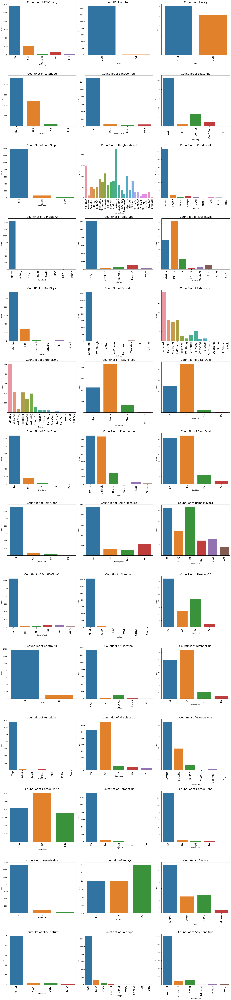

In [ ]:
plt.figure(figsize=(22,100))
for i in range(len(col)):
  plt.subplot(15,3,i+1)
  sns.countplot(x=data1[col[i]])
  plt.title(f"CountPlot of {col[i]}",fontsize=18)
  plt.xticks(rotation=90,fontsize=18)
  plt.tight_layout()

***Observation***
*  From MSZoning i can say that most of the people like house that have zone Residential Low Density,Low density says people like to live in more space like villa's
*  From Street i can say that most of the people like to have home that are praved
*  From top of alley access to property i can say that most of the people like to have home at GRVL
*  From LotShape i can say mostly people like reg and very less people who like to live in IR2,IR3
* From LandContour Flatness of the property i can say that mostly people like to live near flat/Level
* From LotConfiguration i can say that mostly people like inside lot and some people like 20% of corner plot
* From LandSlope: Slope of property i can say mostly 90% of people like Gentle slope
*From Neighborhood: Physical locations within Ames city limitsi can say mostly people like to have have at North Ames after this people also like College Creek
*From Condition1: Proximity to various conditions i can say mostly people like Normal and same with condition 2
*From BldgType: Type of dwelling i can say mostly people like Single-family Detached
*From HouseStyle: Style of dwelling i can say moslty people like onestory and twostory more
*From RoofStyle: Type of roof i can say mostly people like Gable style
*From RoofMatl: Roof material i can say mostly people like clay or tile on roof
*From Exterior1st and Exterior2nd i can say moslty people like Vinyl Siding and people also like Metal Siding and hard bord
*From MasVnrType: Masonry veneer type i can say people like None
*Form exterqual and extercond i can say mostly people are happy with Average quality
*From Foundation: Type of foundation i can say moslty people like Cinder Block and Poured Contrete
*From bsmntqual and bsmtcond i can say people like Good (90-99 inches) and typical also
*From BsmtExposure: Refers to walkout or garden level walls people like No Exposure
*From BsmtFinType1: Rating of basement finished area i can say moslty people like Good Living Quarters and unfinished
*From BsmtFinType2 i can say people like good living quarters
*From CenteralAir i can say moslty people like to lave centeralair
*From Electrical: Electrical system i can say people like SBrkr	Standard Circuit Breakers & Romex
*From Countplot of Garage type i can say people love to have a home that have garage Attached to home
*From Salestype i cna say people love to have a home that have Warranty Deed - Conventional
*From salesconditon i can say people love to have a home that have normal condition  

In [ ]:
data2= data.select_dtypes(exclude=object)
data2

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,62.0,7917,6,5,1999,2000,0.0,0,0,...,0,40,0,0,0,0,0,8,2007,175000
1456,20,85.0,13175,6,6,1978,1988,119.0,790,163,...,349,0,0,0,0,0,0,2,2010,210000
1457,70,66.0,9042,7,9,1941,2006,0.0,275,0,...,0,60,0,0,0,0,2500,5,2010,266500
1458,20,68.0,9717,5,6,1950,1996,0.0,49,1029,...,366,0,112,0,0,0,0,4,2010,142125


In [ ]:
col1=data2.columns

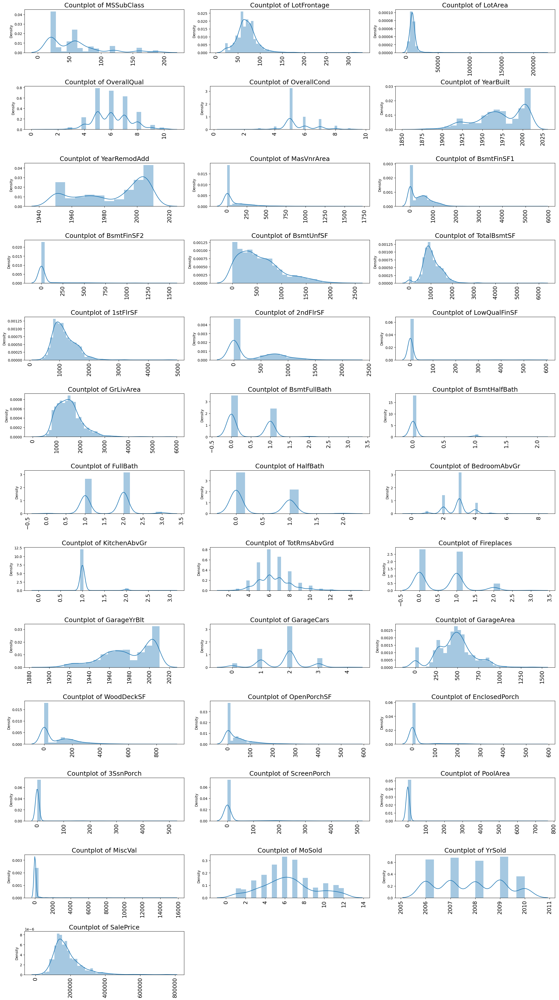

In [ ]:
plt.figure(figsize=(22,300))
for i in range(len(col1)):
  plt.subplot(100,3,i+1)
  sns.distplot(x=data2[col1[i]])
  plt.title(f"Countplot of {col1[i]}",fontsize=18)
  plt.xticks(rotation=90,fontsize=15)
  plt.tight_layout()

**Bivariate Analysis**

*Importig Libraries*

In [ ]:
from numpy import mean
import matplotlib.gridspec as gridspec
from matplotlib.gridspec import GridSpec

Text(0, 0.5, 'Average_SalesPrice')

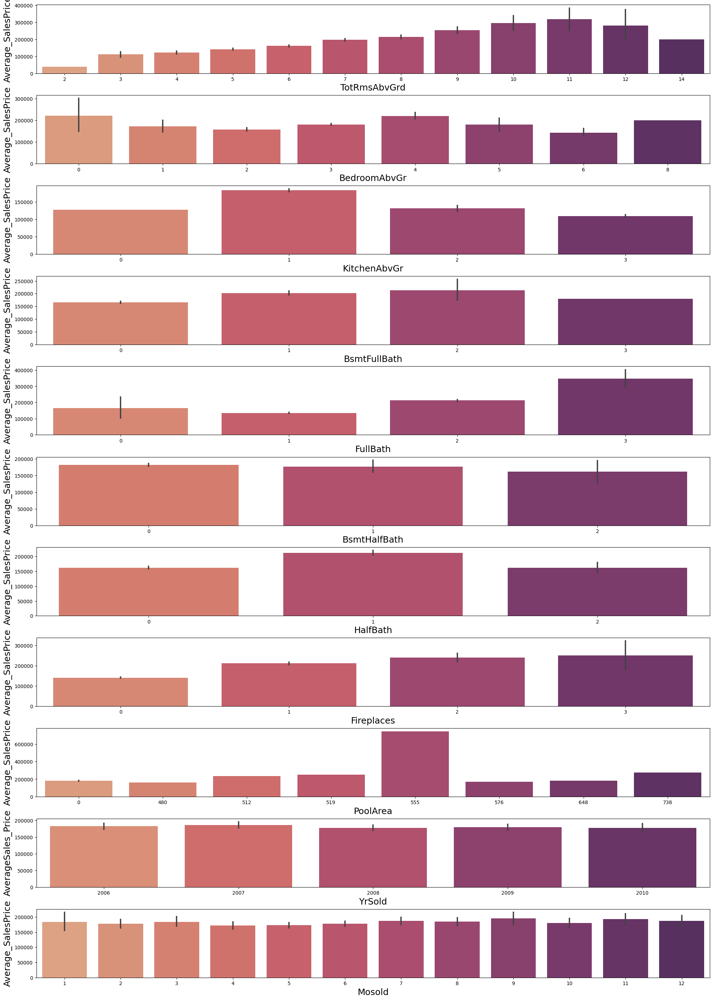

In [ ]:
fig=plt.figure(constrained_layout=True,figsize=(20,30))
gs = GridSpec(12,3,figure=fig)

plt.subplot(gs[0,:])
ax1=sns.barplot(data=data,x="TotRmsAbvGrd",y="SalePrice",estimator = mean, palette ="flare")
plt.xlabel("TotRmsAbvGrd",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[1,:])
ax2=sns.barplot(data=data,x="BedroomAbvGr",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("BedroomAbvGr",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[2,:])
ax3= sns.barplot(data=data,x="KitchenAbvGr",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("KitchenAbvGr",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[3,:])
ax4 =sns.barplot(data=data,x="BsmtFullBath",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("BsmtFullBath",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[4,:])
ax5 =sns.barplot(data=data,x="FullBath",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("FullBath",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[5,:])
ax6 =sns.barplot(data=data,x="BsmtHalfBath",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("BsmtHalfBath",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[6,:])
ax7 =sns.barplot(data=data,x="HalfBath",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("HalfBath",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[7,:])
ax8 =sns.barplot(data=data,x="Fireplaces",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("Fireplaces",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[8,:])
ax9 =sns.barplot(data=data,x="PoolArea",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("PoolArea",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

plt.subplot(gs[9,:])
ax10 =sns.barplot(data=data,x="YrSold",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("YrSold",fontsize=18)
plt.ylabel("AverageSales_Price",fontsize=18)

plt.subplot(gs[10,:])
ax11 =sns.barplot(data=data,x="MoSold",y="SalePrice",estimator=mean,palette="flare")
plt.xlabel("Mosold",fontsize=18)
plt.ylabel("Average_SalesPrice",fontsize=18)

**Observation**

* Total Rooms Above Ground-As the room no. increasing the average price is also increasing till 11th room after that price start decreasing
* Bedroom ABove Ground-For the 0,4,8 Bedroom price is high and price is very less for 6 and 2
* Kitchen Above Ground-as the no of kitchen is increasing the price is reducing and mostly people take one kitchen only
* In Basement full bathrrom and half bathrooms as the bathroom size increasing the price is also increasing
* Fireplaces-As the fireplaces increasing the sale price is also increasing
* PoolArea-as big the pool the more costly the house
* YRsold-the price was high in 2006 as comapre to old year prices descresed in 2008-10
* MOSold-most of the people who sold there home in 09 month they got high price and people who sold there home on 4th month got less price

**Multi-Variate Analysis**

In [ ]:
sns.pairplot(data=data)

**Checking Skewness**

* -1 and -0.5, the data is negatively skewed, and if it is between 0.5 to 1, the data is positively skewed
* Right skew (also called positive skew). A right-skewed distribution is longer on the right side of its peak than on its left.
* Left skew (also called negative skew). A left-skewed distribution is longer on the left side of its peak than on its right.
* Zero skew.

In [ ]:
data.skew()

MSSubClass        1.407657
LotFrontage       2.163569
LotArea          12.207688
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
MasVnrArea        2.669084
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtFullBath      0.596067
BsmtHalfBath      4.103403
FullBath          0.036562
HalfBath          0.675897
BedroomAbvGr      0.211790
KitchenAbvGr      4.488397
TotRmsAbvGrd      0.676341
Fireplaces        0.649565
GarageYrBlt      -0.649415
GarageCars       -0.342549
GarageArea        0.179981
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
MoSold            0.212053
YrSold            0.096269
SalePrice         1.882876
d

**Some important points for skewness**

* Logarithmic Transformation: Apply a logarithmic function to the data. This transformation is useful when the data is positively skewed.

import numpy as np
      
transformed_data = np.log(original_data)

* Square Root Transformation: Take the square root of the data values. This transformation is suitable for reducing right skewness.


import numpy as np

transformed_data = np.sqrt(original_data)

* Box-Cox Transformation: The Box-Cox transformation is a versatile technique that can handle a range of skewness. It includes a parameter lambda (λ) that determines the type of transformation applied. This transformation requires the data to be positive.

from scipy.stats import boxcox
  
transformed_data, lambda_value = boxcox(original_data)

**Outliers**

In [ ]:
x_col = data2.columns.values
len(x_col)

37

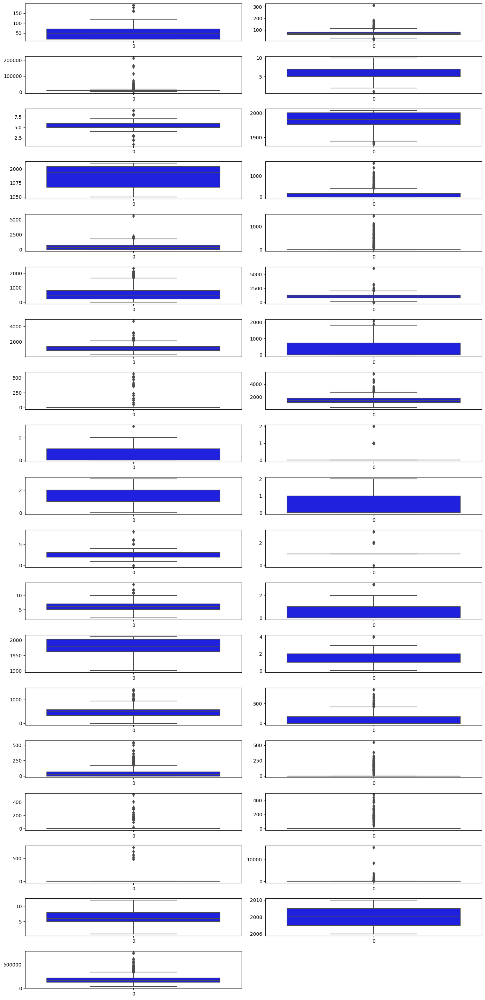

In [ ]:
plt.figure(figsize=(14,30))
for i in range(0,len(x_col)):
  plt.subplot(20,2,i+1)
  sns.boxplot(data2[x_col[i]],color="blue")
  plt.tight_layout()

**Co-relation between the data**

<Axes: >

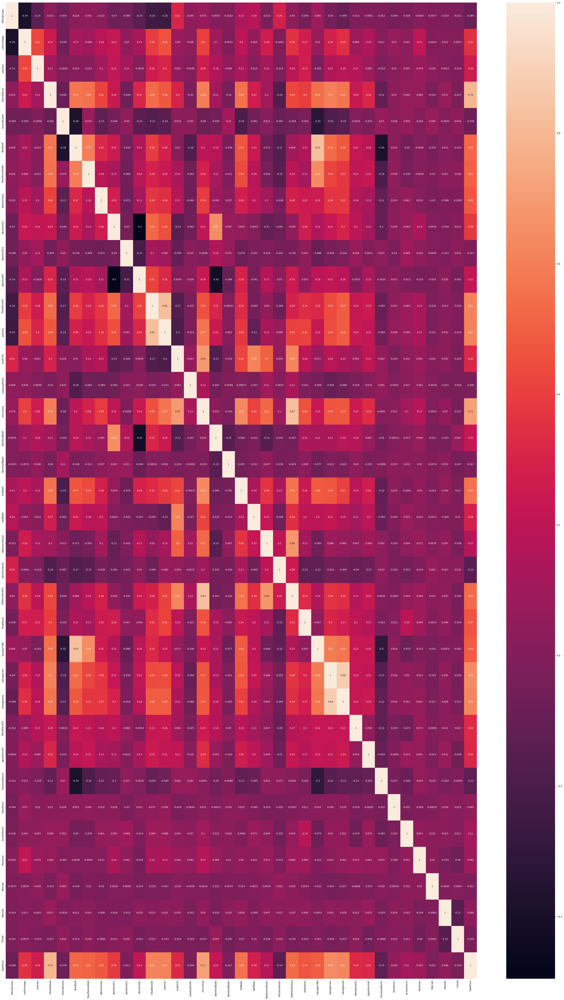

In [ ]:
X_corr=data.corr()
plt.figure(figsize=(45,75))
sns.heatmap(X_corr,annot=True)

**Preprocessing MissingVlaue**

In [ ]:
def preprocess_missingvalue(X):
  X["LotFrontage"] = X.groupby("Neighborhood")["LotFrontage"].transform(lambda x:x.fillna(x.mean()))
  X["Electrical"] = X["Electrical"].fillna(X["Electrical"].mode()[0])
  for col in ['FireplaceQu','GarageType','GarageFinish','BsmtFinType2','PoolQC','Fence','MiscFeature','GarageQual','GarageCond','BsmtQual','BsmtCond','BsmtExposure',
                'BsmtFinType1','BsmtFinType2','MasVnrType','Alley']:
                X[col]=X[col].fillna("None")
  for col in ['GarageYrBlt','MasVnrArea']:
      X[col]=X[col].fillna(0)
  return X

**Feature Engineering**

In [ ]:
def feature_engineering(X):
  X['SqFtPerRoom']=X['GrLivArea']/X['TotRmsAbvGrd']+(X['TotRmsAbvGrd']+
                                                    X['FullBath']+
                                                    X['HalfBath']+
                                                    X['KitchenAbvGr'])
  X['Total_Home_Quality']=X['OverallQual']+X['OverallCond']
  X['Total_Bathrooms']=(X['FullBath']+(0.5*X['HalfBath'])+
                        X['BsmtFullBath']+(0.5*X['BsmtHalfBath']))
  X['HighQualSF']=X['1stFlrSF']+X['2ndFlrSF']
  return X

**Removing Skewness**

In [ ]:
def remove_skewness(X):
  x=X.copy()
  skew=0.5
  X_num=X.select_dtypes(exclude='object')
  skewness=X_num.apply(lambda x:x.skew())
  skewness_col=skewness[abs(skewness)>=skew].index
  X[skewness_col]=power_transform(X[skewness_col])
  X=pd.DataFrame(X,columns=x.columns)
  X = pd.get_dummies(X)
  return X

**Label Encoding**

In [ ]:
def Encoding(X):
  le=LabelEncoder()
  colss =('MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition')

  for c in colss:
    X[c]=le.fit_transform(X[c])
  return X

**Removing Outliers**

In [ ]:
def remove_outliers(X):

  for col in X.columns:
    X[col] = X[col].astype(float)
  for col in X.columns:
    percentile=X[col].quantile([0.01,0.98]).values
    X[col][X[col]<=percentile[0]]=percentile[0]
    X[col][X[col]>=percentile[1]]=percentile[1]

  return X

**Feature Scaling**

In [ ]:
def Feature_Scaling(X):

  x=X.copy()
  scale=StandardScaler()
  X=scale.fit_transform(X)
  X=pd.DataFrame(X,columns=x.columns)

  return X

In [ ]:
X = data.drop('SalePrice',axis=1)
y = data['SalePrice']

**Final Preprocessing**

In [ ]:
def final_preprocessing(X):

  missing = preprocess_missingvalue(X)
  FE = feature_engineering(missing)
  encoding = Encoding(FE)
  skew = remove_skewness(encoding)
  scaling = Feature_Scaling(skew)

  return scaling

In [ ]:
X=final_preprocessing(X)
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SqFtPerRoom,Total_Home_Quality,Total_Bathrooms,HighQualSF
0,0.493460,-0.185595,-0.186539,-0.141171,0.064238,0.024699,0.752862,0.337049,0.617130,-0.237571,...,-0.131103,-0.192177,-1.599111,0.138777,0.388981,0.032281,-0.231053,0.192175,1.642256,0.536472
1,-1.164269,-0.185595,0.492421,0.105609,0.064238,0.024699,0.752862,0.337049,-1.050571,-0.237571,...,-0.131103,-0.192177,-0.489110,-0.614439,0.388981,0.032281,-0.389385,1.373547,0.368581,-0.374715
2,0.493460,-0.185595,-0.044640,0.413721,0.064238,0.024699,-1.371959,0.337049,0.617130,-0.237571,...,-0.131103,-0.192177,0.990891,0.138777,0.388981,0.032281,1.412405,0.192175,1.642256,0.667609
3,0.698191,-0.185595,-0.430890,0.095490,0.064238,0.024699,-1.371959,0.337049,-1.738092,-0.237571,...,-0.131103,-0.192177,-1.599111,-1.367655,0.388981,-2.599251,0.412937,0.192175,-0.268257,0.548784
4,0.493460,-0.185595,0.661903,0.877127,0.064238,0.024699,-1.371959,0.337049,-1.050571,-0.237571,...,-0.131103,-0.192177,2.100892,0.138777,0.388981,0.032281,0.474249,0.782861,1.642256,1.296025


In [ ]:
y

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

**Log Transfrom**

<Axes: title={'center': 'Log normal transformation'}, xlabel='SalePrice', ylabel='Density'>

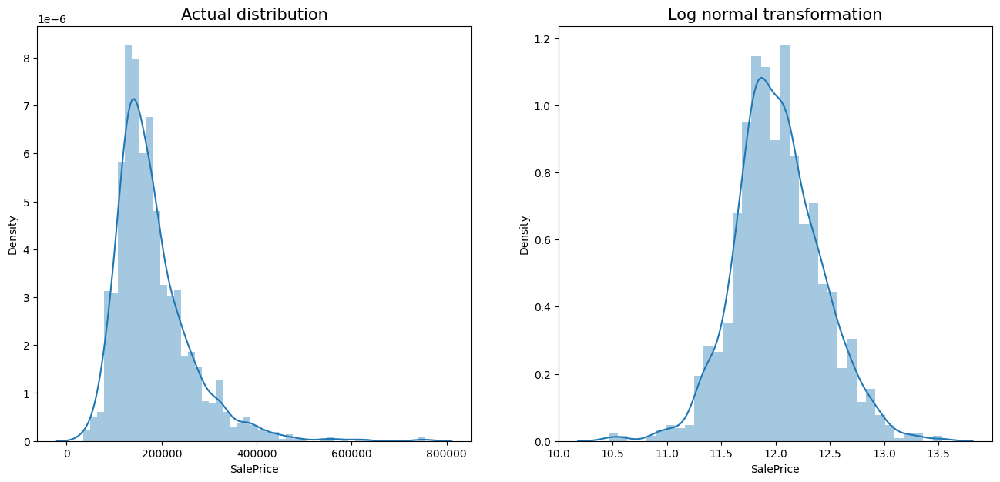

In [33]:
plt.figure(figsize=(16,7))
plt.subplot(1,2,1)
plt.title("Actual distribution",fontsize=15)
sns.distplot(y)
plt.subplot(1,2,2)
plt.title("Log normal transformation",fontsize=15)
sns.distplot(np.log(y))

**Spliting Data into test and train**

In [34]:
from sklearn.model_selection import train_test_split

In [35]:
X_train,X_test,y_train,y_test = train_test_split(X,np.log(y),test_size=0.2,random_state=42)

In [ ]:
X_train.shape

In [37]:
X_test.shape

(292, 82)

**Algorithm models in Dictionary sets**

In [61]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings("ignore")

In [62]:
models={
    "ExtraTreesRegressor":ExtraTreesRegressor(),
    "RandomForestRegressor":RandomForestRegressor(),
    "LinearRegression":LinearRegression(),
    "DecisionTreeRegressor":DecisionTreeRegressor(),
    "Lasso":Lasso(),
    "LGBMRegressor":LGBMRegressor()
}

In [63]:
models.keys()

dict_keys(['ExtraTreesRegressor', 'RandomForestRegressor', 'LinearRegression', 'DecisionTreeRegressor', 'Lasso', 'LGBMRegressor'])

************************************************ ExtraTreesRegressor *****************************************************
MEAN SQUARED ERROR 0.021584905461235884


MEAN ABSOLUTE ERROR 0.09669415970879443


CVS_SCORE 0.8768953531988244


R2_SCORE 0.8843336449368969


RMSE 0.1469180229285566


MODEL PERFORMANCE CURVE


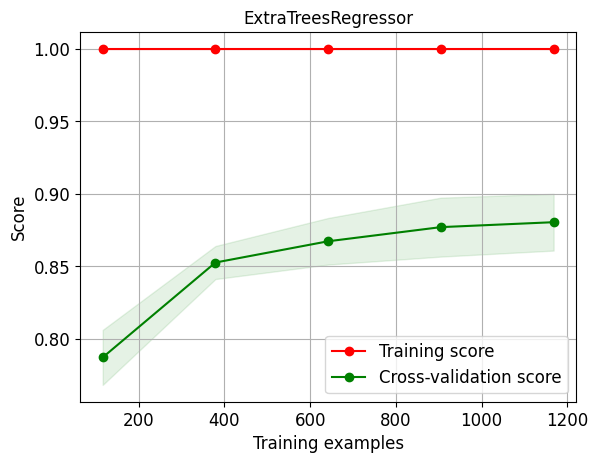

************************************************ RandomForestRegressor *****************************************************
MEAN SQUARED ERROR 0.02144408834844838


MEAN ABSOLUTE ERROR 0.0981241065439324


CVS_SCORE 0.8744390900418967


R2_SCORE 0.8850882371771034


RMSE 0.14643800172239574


MODEL PERFORMANCE CURVE


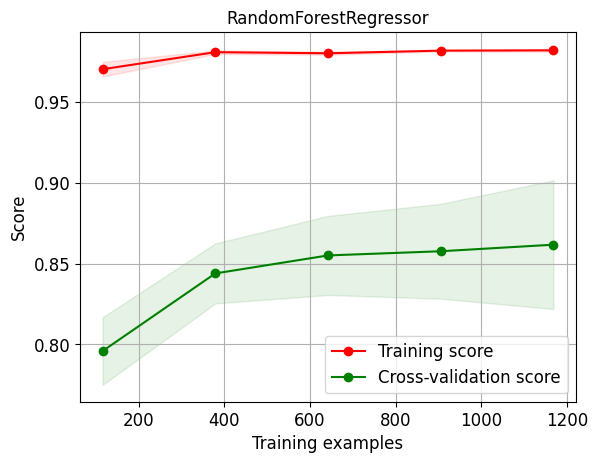

************************************************ LinearRegression *****************************************************
MEAN SQUARED ERROR 0.021183638027755563


MEAN ABSOLUTE ERROR 0.09880647822865779


CVS_SCORE 0.8713908584937649


R2_SCORE 0.8864839041316637


RMSE 0.14554599969685036


MODEL PERFORMANCE CURVE


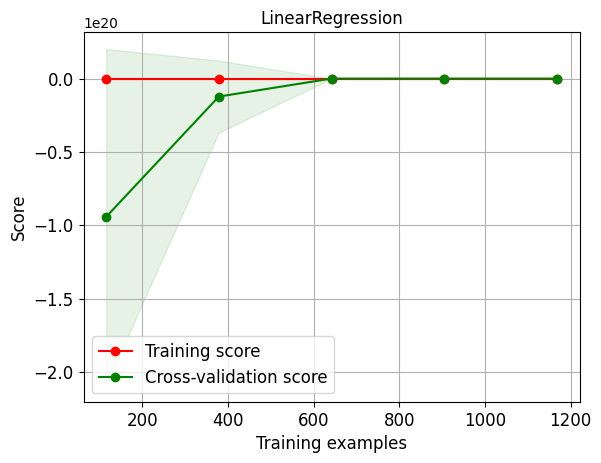

************************************************ DecisionTreeRegressor *****************************************************
MEAN SQUARED ERROR 0.041936513241385365


MEAN ABSOLUTE ERROR 0.1466680319743019


CVS_SCORE 0.6923144014359733


R2_SCORE 0.7752761234281138


RMSE 0.20478406491078685


MODEL PERFORMANCE CURVE


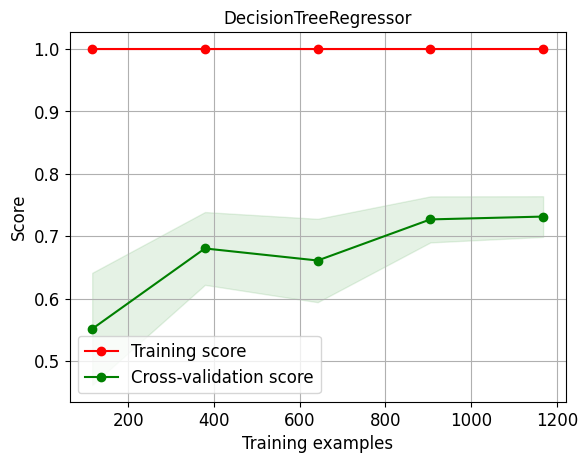

************************************************ Lasso *****************************************************
MEAN SQUARED ERROR 0.18770284240303775


MEAN ABSOLUTE ERROR 0.3371360247419879


CVS_SCORE -0.010218848768859123


R2_SCORE -0.005837327142055315


RMSE 0.43324686081152136


MODEL PERFORMANCE CURVE


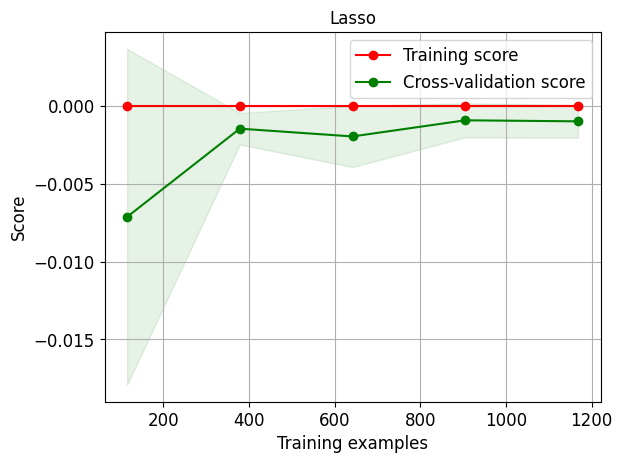

************************************************ LGBMRegressor *****************************************************
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3731
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 77
[LightGBM] [Info] Start training from score 12.030652
MEAN SQUARED ERROR 0.019554301378045747


MEAN ABSOLUTE ERROR 0.09118557571082672
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3724
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 77
[LightGBM] [Info] Start training from

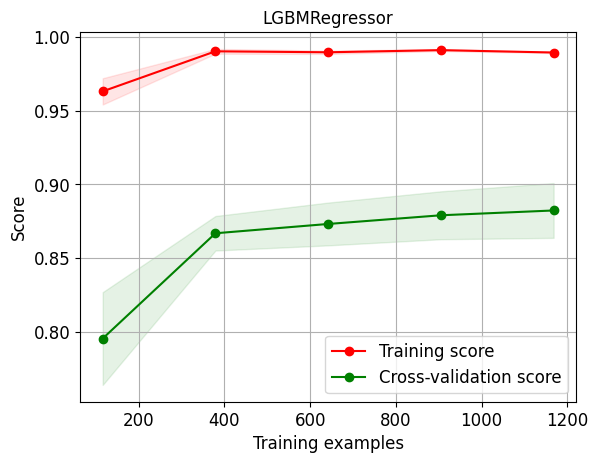

In [64]:
CVS = []
R2 = []
MSE = []
MAE = []
RMSE = []
NAME = []
kf  =  KFold(n_splits = 5,shuffle = True)
for name, model in models.items():
  print("************************************************",name,"*****************************************************")
  NAME.append(name)
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  mse = mean_squared_error(y_test,y_pred)
  MSE.append(mse)
  print("MEAN SQUARED ERROR",mse)
  mae = mean_absolute_error(y_test,y_pred)
  MAE.append(mae)
  print('\n')
  print("MEAN ABSOLUTE ERROR",mae)
  cvs = cross_val_score(model,X,np.log(y),scoring = 'r2',cv = kf).mean()
  CVS.append(cvs)
  print('\n')
  print("CVS_SCORE",cvs)
  r2 = r2_score(y_test,y_pred)
  R2.append(r2)
  print('\n')
  print("R2_SCORE",r2)
  rmse = np.sqrt(mse)
  RMSE.append(rmse)
  print('\n')
  print("RMSE",rmse)
  print('\n')
  print('MODEL PERFORMANCE CURVE')
  skplot.estimators.plot_learning_curve(model,X,np.log(y),cv = kf,scoring = 'r2',title = name,text_fontsize = 'large')
  plt.show()

In [65]:
models_result=pd.DataFrame({
    "NAME":NAME,
    "Cross_Val_Score":CVS,
    "R2_score":R2,
    "Mean_squared_error":MSE,
    "Mean_Absolute_Error":MAE,
    "RMSE":RMSE
})

In [66]:
models_result

,NAME,Cross_Val_Score,R2_score,Mean_squared_error,Mean_Absolute_Error,RMSE
0,ExtraTreesRegressor,0.876895,0.884334,0.021585,0.096694,0.146918
1,RandomForestRegressor,0.874439,0.885088,0.021444,0.098124,0.146438
2,LinearRegression,0.871391,0.886484,0.021184,0.098806,0.145546
3,DecisionTreeRegressor,0.692314,0.775276,0.041937,0.146668,0.204784
4,Lasso,-0.010219,-0.005837,0.187703,0.337136,0.433247
5,LGBMRegressor,0.886148,0.895215,0.019554,0.091186,0.139837


**Hyperparameter Tuning**

In [67]:
lgb = LGBMRegressor()
lgb.fit(X_train,y_train)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3731
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 77
[LightGBM] [Info] Start training from score 12.030652


LGBMRegressor()

In [68]:
lgb.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [69]:
param={
    'boosting_type': ['gbdt','dart'],
    'n_estimators':[100,200,50,600],
    'importance_type': ['mse','mae'],
    'max_depth': [-1,1,2,3,4,5]
}

In [70]:
GRID = GridSearchCV(estimator=lgb,scoring='r2',param_grid=param,n_jobs=-1,cv = kf)

In [71]:
GRID.fit(X,np.log(y))

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3984
[LightGBM] [Info] Number of data points in the train set: 1460, number of used features: 78
[LightGBM] [Info] Start training from score 12.024051
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=LGBMRegressor(), n_jobs=-1,
             param_grid={'boosting_type': ['gbdt', 'dart'],
                         'importance_type': ['mse', 'mae'],
                         'max_depth': [-1, 1, 2, 3, 4, 5],
                         'n_estimators': [100, 200, 50, 600]},
             scoring='r2')

In [72]:
GRID.best_params_

{'boosting_type': 'gbdt',
 'importance_type': 'mse',
 'max_depth': 2,
 'n_estimators': 600}

In [73]:
GRID.best_score_

0.8958250027133928

In [74]:
Light = LGBMRegressor(boosting_type= 'gbdt',
 importance_type= 'mse',
 max_depth= 4,
 n_estimators= 200)

In [75]:
Light.fit(X_train,y_train)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3731
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 77
[LightGBM] [Info] Start training from score 12.030652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

LGBMRegressor(importance_type='mse', max_depth=4, n_estimators=200)

In [76]:
test = pd.read_csv("/content/train  of regression dataset.csv")

In [77]:
test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [78]:
test = final_preprocessing(test)

In [79]:
test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,...,YrSold,SaleType,SaleCondition,SalePrice,SqFtPerRoom,Total_Home_Quality,Total_Bathrooms,HighQualSF,Utilities_AllPub,Utilities_NoSeWa
0,-1.730865,0.493460,-0.185595,-0.186539,-0.141171,0.064238,0.024699,0.752862,0.337049,0.617130,...,0.138777,0.388981,0.032281,0.571155,-0.231053,0.192175,1.642256,0.536472,0.02618,-0.02618
1,-1.728492,-1.164269,-0.185595,0.492421,0.105609,0.064238,0.024699,0.752862,0.337049,-1.050571,...,-0.614439,0.388981,0.032281,0.227627,-0.389385,1.373547,0.368581,-0.374715,0.02618,-0.02618
2,-1.726120,0.493460,-0.185595,-0.044640,0.413721,0.064238,0.024699,-1.371959,0.337049,0.617130,...,0.138777,0.388981,0.032281,0.741869,1.412405,0.192175,1.642256,0.667609,0.02618,-0.02618
3,-1.723747,0.698191,-0.185595,-0.430890,0.095490,0.064238,0.024699,-1.371959,0.337049,-1.738092,...,-1.367655,0.388981,-2.599251,-0.425386,0.412937,0.192175,-0.268257,0.548784,0.02618,-0.02618
4,-1.721374,0.493460,-0.185595,0.661903,0.877127,0.064238,0.024699,-1.371959,0.337049,-1.050571,...,0.138777,0.388981,0.032281,1.015293,0.474249,0.782861,1.642256,1.296025,0.02618,-0.02618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.721374,0.493460,-0.185595,-0.331915,-0.266808,0.064238,0.024699,0.752862,0.337049,0.617130,...,-0.614439,0.388981,0.032281,0.136679,0.241497,-0.398511,0.368581,0.423414,0.02618,-0.02618
1456,1.723747,-1.164269,-0.185595,0.703606,0.722071,0.064238,0.024699,0.752862,0.337049,0.617130,...,1.645210,0.388981,0.032281,0.588812,1.386847,0.192175,1.005418,1.118350,0.02618,-0.02618
1457,1.726120,0.698191,-0.185595,-0.138865,-0.010330,0.064238,0.024699,0.752862,0.337049,0.617130,...,1.645210,0.388981,0.032281,1.170202,0.770533,2.554919,-0.268257,1.486354,0.02618,-0.02618
1458,1.728492,-1.164269,-0.185595,-0.044640,0.129088,0.064238,0.024699,0.752862,0.337049,0.617130,...,1.645210,0.388981,0.032281,-0.387136,-0.308095,-0.398511,-0.268257,-0.843970,0.02618,-0.02618
